<a href="https://colab.research.google.com/github/rish94abh/CS230-Project/blob/main/CS230_UNet.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!pip install torch torchvision torchaudio
!pip install opencv-python numpy svgpathtools pillow scikit-image tqdm matplotlib svgwrite


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 68.3/68.3 kB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.1/67.1 kB 6.0 MB/s eta 0:00:00


## Specify Image Directory from Google Drive

Enter the path to your image directory in Google Drive. This directory should contain the `.png` files that correspond to your SVG annotations.

In [ ]:
image_drive_dir = '/content/drive/MyDrive/CS230/Training/images'
svg_drive_dir = '/content/drive/MyDrive/CS230/Training/labels_svg'

print(f"Image directory set to: {image_drive_dir}")
print(f"SVG directory set to: {svg_drive_dir}")

Image directory set to: /content/drive/MyDrive/CS230/Training/images
SVG directory set to: /content/drive/MyDrive/CS230/Training/labels_svg


This code prepares image–mask pairs for training a U-Net semantic-segmentation model.
Imports:
Uses numpy, svgpathtools for parsing SVGs, PIL for image/mask creation, and os/re for file and style parsing.
normalize_color():

Standardizes SVG color strings (hex, rgb(), named colors). Returns lowercase values or None for “none,” meaning no fill.
svg_to_mask(svg_path, image_size):

Parses an SVG and converts each filled path into a binary mask.
Reads all paths and their attributes.
Extracts and normalizes each path’s fill color (direct fill= or from style).

Creates one PIL mask per unique color.
Rasterizes each path onto its color-specific mask.
Returns a dict: {color: binary_mask_array}.
SEMSegDataset (PyTorch Dataset):
Loads images and their SVG annotations.

__getitem__:
Opens the grayscale image and associated SVG.
Uses svg_to_mask to obtain per-color masks.
Merges them into one binary mask using element-wise max (logical OR).
Resizes image and mask.
Applies transforms (e.g., ToTensor).
Output: a ready-to-train image and segmentation mask.
Overall:
This pipeline converts complex, multi-colored SVG annotations into clean, model-ready binary masks for U-Net training.

In [ ]:
import cv2
import numpy as np
from svgpathtools import svg2paths, parse_path
from PIL import Image, ImageDraw
import os
import re # Import regex for parsing style attributes

# Helper function to normalize colors (e.g., #RRGGBB, rgb(r,g,b) to hex or a common representation)
def normalize_color(color_str):
    if not color_str or color_str.lower() == 'none':
        return None
    # Basic hex color check
    if re.match(r'^#[0-9a-fA-F]{6}$', color_str):
        return color_str.lower()
    # Basic RGB color check (simplistic, could be more robust)
    elif color_str.startswith('rgb('):
        # Extract numbers, convert to hex. For simplicity, we'll just keep it as is if complex.
        return color_str.lower().replace(' ', '')
    # Handle color names (e.g., 'red', 'blue') - for this example, we'll keep them as is
    else:
        return color_str.lower()

def svg_to_mask(svg_path, image_size):
    """Convert an SVG file into a dictionary of binary masks (numpy arrays) by fill color."""
    masks_by_color_pil = {}
    # Parse SVG paths and their attributes
    paths, attributes = svg2paths(svg_path)

    for path, attrs in zip(paths, attributes):
        fill_color = None

        # 1. Prioritize 'fill' attribute
        if 'fill' in attrs:
            fill_color = attrs['fill']
        # 2. If no 'fill' attribute, try parsing 'style'
        elif 'style' in attrs:
            style_str = attrs['style']
            fill_match = re.search(r'fill:([^;]+)', style_str)
            if fill_match:
                fill_color = fill_match.group(1)

        # Normalize color string
        normalized_color = normalize_color(fill_color)

        if normalized_color is None:
            continue # Skip if color is 'none' or could not be determined

        # If this color is new, create a new mask for it
        if normalized_color not in masks_by_color_pil:
            masks_by_color_pil[normalized_color] = Image.new('L', image_size, 0)

        draw = ImageDraw.Draw(masks_by_color_pil[normalized_color])

        # Convert current SVG path segments into a list of points
        # svgpathtools path objects provide points, but ImageDraw.polygon expects a flat list
        points = []
        for segment in path:
            # For each segment, add its start point, and if it's a line/bezier, add its end points
            points.append((segment.start.real, segment.start.imag))
            if hasattr(segment, 'end'): # All segments have an 'end' property
                points.append((segment.end.real, segment.end.imag))
        # Remove duplicate points if any from segment chaining
        points = list(dict.fromkeys(points)) # Preserves order

        if len(points) >= 2: # At least two points define a line, three a polygon
            # ImageDraw.polygon requires a flat list of coordinates (x1, y1, x2, y2, ...)
            flat_points = [coord for point in points for coord in point]
            draw.polygon(flat_points, outline=1, fill=1)

    # Convert PIL Images to NumPy arrays
    masks_by_color_np = {
        color: np.array(pil_mask, dtype=np.uint8)
        for color, pil_mask in masks_by_color_pil.items()
    }

    return masks_by_color_np

from torch.utils.data import Dataset
from torchvision import transforms
from PIL import Image
import numpy as np
import os

class SEMSegDataset(Dataset):
    def __init__(self, img_dir, svg_dir, resize_target=(1024, 1024), transform=None):
        self.img_dir = img_dir
        self.svg_dir = svg_dir
        self.img_files = [f for f in os.listdir(img_dir) if f.endswith('.png')]
        self.resize_target = resize_target
        self.transform = transform # This transform will now only include ToTensor

    def __len__(self):
        return len(self.img_files)

    def __getitem__(self, idx):
        img_name = self.img_files[idx]
        img_path = os.path.join(self.img_dir, img_name)
        svg_path = os.path.join(self.svg_dir, img_name.replace('.png', '.svg'))

        img = Image.open(img_path).convert('L')  # SEM images are grayscale, PIL Image

        # Call the modified svg_to_mask. It now returns a dict of masks.
        # For this dataset, we might need to decide how to combine or select a mask.
        # For now, let's assume we want to combine all masks into one binary mask.
        masks_by_color = svg_to_mask(svg_path, img.size)

        # Combine all color masks into a single binary mask for the dataset's purpose
        # If no masks are found for any color, create an empty mask.
        if masks_by_color:
            combined_mask_np = np.zeros(img.size[::-1], dtype=np.uint8) # img.size is (width, height), numpy is (height, width)
            for color_mask_np in masks_by_color.values():
                combined_mask_np = np.maximum(combined_mask_np, color_mask_np)
        else:
            combined_mask_np = np.zeros(img.size[::-1], dtype=np.uint8)

        mask = Image.fromarray(combined_mask_np) # Convert numpy mask to PIL Image (L mode)

        # Explicitly resize PIL Images before any further transformations
        if self.resize_target:
            img = transforms.Resize(self.resize_target)(img)
            mask = transforms.Resize(self.resize_target)(mask)

        if self.transform:
            img = self.transform(img)
            mask = self.transform(mask)

        return img, mask

## Identify All Unique Colors Across SVG Files


In [ ]:
import os
from PIL import Image
from svgpathtools import svg2paths, parse_path
from tqdm import tqdm

def get_unique_svg_colors():
    unique_colors = set()
    svg_files = [f for f in os.listdir('/content/drive/MyDrive/CS230/Training/labels_svg') if f.endswith('.svg')]

    print(f"Scanning {len(svg_files)} SVG files for unique colors...")

    for svg_filename in tqdm(svg_files, desc="Collecting unique colors"):
        svg_path = os.path.join('/content/drive/MyDrive/CS230/Training/labels_svg', svg_filename)
        img_filename = svg_filename.replace('.svg', '.png')
        img_path = os.path.join('/content/drive/MyDrive/CS230/Training/images', img_filename)

        if not os.path.exists(img_path):
            print(f"WARNING: Image file for {svg_filename} not found at {img_path}. Skipping color extraction for this SVG.")
            continue

        try:
            with Image.open(img_path) as img_pil:
                image_size = img_pil.size # (width, height)

            # svg_to_mask now returns a dictionary of masks by color
            masks_by_color_np = svg_to_mask(svg_path, image_size)

            # Add all unique colors from this SVG to our set
            unique_colors.update(masks_by_color_np.keys())
        except Exception as e:
            print(f"ERROR processing {svg_filename} for colors: {e}")

    sorted_unique_colors = sorted(list(unique_colors))
    num_classes = len(sorted_unique_colors)

    print(f"\nUnique colors found: {sorted_unique_colors}")
    print(f"Total number of unique colors (num_classes): {num_classes}")

    return sorted_unique_colors, num_classes

# Call the function to get unique colors and number of classes
unique_colors_list, num_classes_detected = get_unique_svg_colors()

# Print the results for verification
print(f"Final unique colors list: {unique_colors_list}")
print(f"Final number of classes: {num_classes_detected}")


Scanning 6 SVG files for unique colors...



Unique colors found: ['blue', 'green']
Total number of unique colors (num_classes): 2
Final unique colors list: ['blue', 'green']
Final number of classes: 2


## Update UNet Architecture for Multi-Class Output



In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F


class UNet(nn.Module):
    def __init__(self, in_channels=1, out_channels=1, features=[64, 128, 256, 512]):
        super(UNet, self).__init__()

        # ---------- Encoder ----------
        self.enc_blocks = nn.ModuleList()
        self.pools = nn.ModuleList()

        ch = in_channels
        for feat in features:
            self.enc_blocks.append(self._block(ch, feat))
            self.pools.append(nn.MaxPool2d(2))
            ch = feat

        # ---------- Bottleneck ----------
        self.bottleneck = self._block(features[-1], features[-1] * 2)

        # ---------- Decoder ----------
        self.up_transpose = nn.ModuleList()
        self.dec_blocks = nn.ModuleList()

        # Store reversed features for correct indexing
        rev_features = list(reversed(features))

        # Iterate in reverse order
        for i, feat in enumerate(rev_features):
            self.up_transpose.append(
                nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
            )

            # Calculate input channels for the decoder block
            if i == 0:
                # First decoder block: skip channels (features[-1]) + bottleneck output channels (features[-1] * 2)
                in_channels_dec_block = feat + (features[-1] * 2)
            else:
                # Subsequent decoder blocks: skip channels (feat) + upsampled output from previous decoder block (rev_features[i-1])
                in_channels_dec_block = feat + rev_features[i-1]

            self.dec_blocks.append(
                self._block(in_channels_dec_block, feat)
            )

        # ---------- Final conv ----------
        self.final_conv = nn.Conv2d(features[0], out_channels, kernel_size=1)

    def _block(self, in_ch, out_ch):
        class ResidualBlock(nn.Module):
            def __init__(self, in_channels, out_channels):
                super(ResidualBlock, self).__init__()
                self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1, bias=False)
                self.norm1 = nn.InstanceNorm2d(out_channels)
                self.relu = nn.ReLU(inplace=True)
                self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1, bias=False)
                self.norm2 = nn.InstanceNorm2d(out_channels)

                # Shortcut connection
                self.shortcut = nn.Sequential()
                if in_channels != out_channels:
                    self.shortcut = nn.Sequential(
                        nn.Conv2d(in_channels, out_channels, kernel_size=1, bias=False),
                        nn.InstanceNorm2d(out_channels)
                    )

            def forward(self, x):
                identity = x # Store the input for residual connection

                out = self.conv1(x)
                out = self.norm1(out)
                out = self.relu(out)

                out = self.conv2(out)
                out = self.norm2(out)

                # Add shortcut to main path
                out += self.shortcut(identity)
                out = self.relu(out) # Apply ReLU after addition

                return out
        return ResidualBlock(in_ch, out_ch)

    def forward(self, x):
        skips = []

        # ---- Encoder ----
        for enc, pool in zip(self.enc_blocks, self.pools):
            x = enc(x)
            skips.append(x)
            x = pool(x)

        # ---- Bottleneck ----
        x = self.bottleneck(x)

        # ---- Decoder ----
        skips = skips[::-1]
        for i in range(len(self.up_transpose)):
            x = self.up_transpose[i](x)
            skip = skips[i]
            if x.shape != skip.shape:
                x = F.interpolate(x, size=skip.shape[2:])
            x = torch.cat([skip, x], dim=1)
            x = self.dec_blocks[i](x)

        # ---- Output ----
        return self.final_conv(x)

# Attention based UNET[Optional]


In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F


# ---------------------------------------------------------
#                 ATTENTION GATE BLOCK
# ---------------------------------------------------------
class AttentionGate(nn.Module):
    def __init__(self, F_g, F_l, F_int):
        super().__init__()

        # Gate feature (decoder)
        self.W_g = nn.Sequential(
            nn.Conv2d(F_g, F_int, kernel_size=1, stride=1, padding=0, bias=True),
            nn.BatchNorm2d(F_int)
        )

        # Skip connection feature (encoder)
        self.W_x = nn.Sequential(
            nn.Conv2d(F_l, F_int, kernel_size=1, stride=1, padding=0, bias=True),
            nn.BatchNorm2d(F_int)
        )

        # Combine and activate
        self.psi = nn.Sequential(
            nn.Conv2d(F_int, 1, kernel_size=1, stride=1, padding=0, bias=True),
            nn.BatchNorm2d(1),
            nn.Sigmoid()
        )

        self.relu = nn.ReLU(inplace=True)

    def forward(self, g, x):
        # g : decoder features
        # x : encoder skip
        g1 = self.W_g(g)
        x1 = self.W_x(x)

        psi = self.relu(g1 + x1)
        psi = self.psi(psi)

        return x * psi  # gated skip features


# ---------------------------------------------------------
#                        UNET
# ---------------------------------------------------------
class UNet(nn.Module):
    def __init__(self, in_channels=1, out_channels=1, features=[64,128,256,512]):
        super().__init__()

        # ---------- Encoder ----------
        self.enc_blocks = nn.ModuleList()
        self.downs = nn.ModuleList()   # strided conv replaces MaxPool

        ch = in_channels
        for feat in features:
            self.enc_blocks.append(self._block(ch, feat))
            self.downs.append(
                nn.Conv2d(feat, feat, kernel_size=3, stride=2, padding=1)   # STRIDED DOWN
            )
            ch = feat

        # ---------- Bottleneck ----------
        bottleneck_channels = features[-1] * 2
        self.bottleneck = self._block(features[-1], bottleneck_channels)

        # ---------- Decoder ----------
        self.up_transpose = nn.ModuleList()
        self.dec_blocks = nn.ModuleList()
        self.attention_gates = nn.ModuleList()

        rev_features = list(reversed(features))

        dec_in = bottleneck_channels

        for skip_ch in rev_features:
            # Upsample
            self.up_transpose.append(
                nn.ConvTranspose2d(dec_in, skip_ch, kernel_size=2, stride=2)
            )

            # Attention gate
            self.attention_gates.append(
                AttentionGate(F_g=skip_ch, F_l=skip_ch, F_int=skip_ch // 2)
            )

            # Decoder block: (skip + upsampled) → skip_ch
            self.dec_blocks.append(
                self._block(skip_ch * 2, skip_ch)
            )

            dec_in = skip_ch

        # ---------- Final conv ----------
        self.final_conv = nn.Conv2d(features[0], out_channels, kernel_size=1)

    # -----------------------------------------------------
    #           Residual Block With GroupNorm
    # -----------------------------------------------------
    def _block(self, in_ch, out_ch):
        class ResidualBlock(nn.Module):
            def __init__(self, in_channels, out_channels):
                super().__init__()

                self.relu = nn.ReLU(inplace=True)
                self.conv1 = nn.Conv2d(in_channels, out_channels, 3, padding=1, bias=False)
                self.norm1 = nn.GroupNorm(8, out_channels)

                self.conv2 = nn.Conv2d(out_channels, out_channels, 3, padding=1, bias=False)
                self.norm2 = nn.GroupNorm(8, out_channels)

                # shortcut
                if in_channels != out_channels:
                    self.shortcut = nn.Sequential(
                        nn.Conv2d(in_channels, out_channels, kernel_size=1, bias=False),
                        nn.GroupNorm(8, out_channels)
                    )
                else:
                    self.shortcut = nn.Identity()

            def forward(self, x):
                identity = x

                out = self.relu(self.norm1(self.conv1(x)))
                out = self.norm2(self.conv2(out))

                out += self.shortcut(identity)
                return self.relu(out)

        return ResidualBlock(in_ch, out_ch)

    # -----------------------------------------------------
    #                     FORWARD
    # -----------------------------------------------------
    def forward(self, x):

        input_H, input_W = x.shape[2], x.shape[3]

        skips = []

        # Encoder
        for enc, down in zip(self.enc_blocks, self.downs):
            x = enc(x)
            skips.append(x)
            x = down(x)  # strided conv downsampling

        # Bottleneck
        x = self.bottleneck(x)

        # Decoder
        skips = list(reversed(skips))

        for up, att, dec, skip in zip(self.up_transpose, self.attention_gates, self.dec_blocks, skips):
            x = up(x)

            # Attention-gated skip
            gated_skip = att(x, skip)

            # Concatenate
            x = torch.cat([gated_skip, x], dim=1)

            # Decoder block
            x = dec(x)

        # Final conv
        x= self.final_conv(x)

        # --- Guarantee SAME output shape as input ---
        x = F.interpolate(x, size=(input_H, input_W), mode='bilinear', align_corners=False)
        return x


## Modify SEMSegDataset to Return Multi-Channel Masks


In [ ]:
import cv2
import numpy as np
from svgpathtools import svg2paths, parse_path
from PIL import Image, ImageDraw
import os
import re # Import regex for parsing style attributes

# Helper function to normalize colors (e.g., #RRGGBB, rgb(r,g,b) to hex or a common representation)
def normalize_color(color_str):
    if not color_str or color_str.lower() == 'none':
        return None
    # Basic hex color check
    if re.match(r'^#[0-9a-fA-F]{6}$', color_str):
        return color_str.lower()
    # Basic RGB color check (simplistic, could be more robust)
    elif color_str.startswith('rgb('):
        # Extract numbers, convert to hex. For simplicity, we'll just keep it as is if complex.
        return color_str.lower().replace(' ', '')
    # Handle color names (e.g., 'red', 'blue') - for this example, we'll keep them as is
    else:
        return color_str.lower()

def svg_to_mask(svg_path, image_size):
    """Convert an SVG file into a dictionary of binary masks (numpy arrays) by fill color."""
    masks_by_color_pil = {}
    # Parse SVG paths and their attributes
    paths, attributes = svg2paths(svg_path)

    for path, attrs in zip(paths, attributes):
        fill_color = None

        # 1. Prioritize 'fill' attribute
        if 'fill' in attrs:
            fill_color = attrs['fill']
        # 2. If no 'fill' attribute, try parsing 'style'
        elif 'style' in attrs:
            style_str = attrs['style']
            fill_match = re.search(r'fill:([^;]+)', style_str)
            if fill_match:
                fill_color = fill_match.group(1)

        # Normalize color string
        normalized_color = normalize_color(fill_color)

        if normalized_color is None:
            continue # Skip if color is 'none' or could not be determined

        # If this color is new, create a new mask for it
        if normalized_color not in masks_by_color_pil:
            masks_by_color_pil[normalized_color] = Image.new('L', image_size, 0)

        draw = ImageDraw.Draw(masks_by_color_pil[normalized_color])

        # Convert current SVG path segments into a list of points
        # svgpathtools path objects provide points, but ImageDraw.polygon expects a flat list
        points = []
        for segment in path:
            # For each segment, add its start point, and if it's a line/bezier, add its end points
            points.append((segment.start.real, segment.start.imag))
            if hasattr(segment, 'end'): # All segments have an 'end' property
                points.append((segment.end.real, segment.end.imag))
        # Remove duplicate points if any from segment chaining
        points = list(dict.fromkeys(points)) # Preserves order

        if len(points) >= 2: # At least two points define a line, three a polygon
            # ImageDraw.polygon requires a flat list of coordinates (x1, y1, x2, y2, ...)
            flat_points = [coord for point in points for coord in point]
            draw.polygon(flat_points, outline=1, fill=1)

    # Convert PIL Images to NumPy arrays
    masks_by_color_np = {
        color: np.array(pil_mask, dtype=np.uint8)
        for color, pil_mask in masks_by_color_pil.items()
    }

    return masks_by_color_np

from torch.utils.data import Dataset
from torchvision import transforms
from PIL import Image
import numpy as np
import os
import torch

class SEMSegDataset(Dataset):
    def __init__(self, img_dir, svg_dir, unique_colors, resize_target=(1024, 1024), transform=None):
        self.img_dir = img_dir
        self.svg_dir = svg_dir
        self.img_files = [f for f in os.listdir(img_dir) if f.endswith('.png')]
        self.unique_colors = unique_colors
        self.num_classes = len(unique_colors)
        self.resize_target = resize_target
        self.transform = transform # This transform will now only include ToTensor

    def __len__(self):
        return len(self.img_files)

    def __getitem__(self, idx):
        img_name = self.img_files[idx]
        img_path = os.path.join(self.img_dir, img_name)
        svg_path = os.path.join(self.svg_dir, img_name.replace('.png', '.svg'))

        img = Image.open(img_path).convert('L')  # SEM images are grayscale, PIL Image
        W, H = img.size

        # Call svg_to_mask to get a dictionary of masks by color
        masks_by_color = svg_to_mask(svg_path, (W, H))

        target_masks_pil = []
        for color in self.unique_colors:
            mask_np = masks_by_color.get(color, np.zeros((H, W), dtype=np.uint8))
            pil_mask = Image.fromarray(mask_np * 255) # Convert to PIL 'L' mode, 255 for white, 0 for black
            target_masks_pil.append(pil_mask)

        # Explicitly resize PIL Images for both input image and all target masks
        if self.resize_target:
            img = transforms.Resize(self.resize_target)(img)
            target_masks_pil = [transforms.Resize(self.resize_target)(m) for m in target_masks_pil]

        # Apply transform (ToTensor) to the image
        if self.transform:
            img = self.transform(img)
        else:
            img = transforms.ToTensor()(img) # Default to ToTensor if no transform provided

        # Apply transform (ToTensor) to each mask and concatenate
        mask_tensors = []
        for pil_mask in target_masks_pil:
            if self.transform:
                mask_tensors.append(self.transform(pil_mask))
            else:
                mask_tensors.append(transforms.ToTensor()(pil_mask)) # Default to ToTensor

        multi_channel_mask_tensor = torch.cat(mask_tensors, dim=0)

        return img, multi_channel_mask_tensor


## Update Training Loop for Multi-Class Segmentation



Epoch 1/50 - Validating: 100%|██████████| 4/4 [00:33<00:00,  8.45s/it]



Epoch 1/50
  Training Loss:   0.3639
  Validation Loss: 0.2044


Epoch 2/50 - Validating: 100%|██████████| 4/4 [00:25<00:00,  6.37s/it]



Epoch 2/50
  Training Loss:   0.1650
  Validation Loss: 0.1566


Epoch 3/50 - Validating: 100%|██████████| 4/4 [00:25<00:00,  6.44s/it]



Epoch 3/50
  Training Loss:   0.1360
  Validation Loss: 0.1422


Epoch 4/50 - Validating: 100%|██████████| 4/4 [00:25<00:00,  6.38s/it]



Epoch 4/50
  Training Loss:   0.1116
  Validation Loss: 0.1155


Epoch 5/50 - Validating: 100%|██████████| 4/4 [00:25<00:00,  6.41s/it]



Epoch 5/50
  Training Loss:   0.0988
  Validation Loss: 0.1156


Epoch 6/50 - Validating: 100%|██████████| 4/4 [00:25<00:00,  6.47s/it]



Epoch 6/50
  Training Loss:   0.0894
  Validation Loss: 0.0979


Epoch 7/50 - Validating: 100%|██████████| 4/4 [00:26<00:00,  6.53s/it]



Epoch 7/50
  Training Loss:   0.0889
  Validation Loss: 0.0965


Epoch 8/50 - Validating: 100%|██████████| 4/4 [00:26<00:00,  6.55s/it]



Epoch 8/50
  Training Loss:   0.0854
  Validation Loss: 0.0941


Epoch 9/50 - Validating: 100%|██████████| 4/4 [00:25<00:00,  6.44s/it]



Epoch 9/50
  Training Loss:   0.0851
  Validation Loss: 0.0903


Epoch 10/50 - Validating: 100%|██████████| 4/4 [00:25<00:00,  6.40s/it]



Epoch 10/50
  Training Loss:   0.0793
  Validation Loss: 0.0861


Epoch 11/50 - Validating: 100%|██████████| 4/4 [00:25<00:00,  6.50s/it]



Epoch 11/50
  Training Loss:   0.0788
  Validation Loss: 0.0871


Epoch 12/50 - Validating: 100%|██████████| 4/4 [00:25<00:00,  6.42s/it]



Epoch 12/50
  Training Loss:   0.0780
  Validation Loss: 0.0868


Epoch 13/50 - Validating: 100%|██████████| 4/4 [00:25<00:00,  6.46s/it]



Epoch 13/50
  Training Loss:   0.0784
  Validation Loss: 0.0828


Epoch 14/50 - Validating: 100%|██████████| 4/4 [00:25<00:00,  6.45s/it]



Epoch 14/50
  Training Loss:   0.0770
  Validation Loss: 0.0829


Epoch 15/50 - Validating: 100%|██████████| 4/4 [00:25<00:00,  6.40s/it]



Epoch 15/50
  Training Loss:   0.0774
  Validation Loss: 0.0817


Epoch 16/50 - Validating: 100%|██████████| 4/4 [00:25<00:00,  6.38s/it]



Epoch 16/50
  Training Loss:   0.0741
  Validation Loss: 0.0814


Epoch 17/50 - Validating: 100%|██████████| 4/4 [00:25<00:00,  6.45s/it]



Epoch 17/50
  Training Loss:   0.0740
  Validation Loss: 0.0817


Epoch 18/50 - Validating: 100%|██████████| 4/4 [00:25<00:00,  6.44s/it]



Epoch 18/50
  Training Loss:   0.0733
  Validation Loss: 0.0827


Epoch 19/50 - Validating: 100%|██████████| 4/4 [00:25<00:00,  6.49s/it]



Epoch 19/50
  Training Loss:   0.0742
  Validation Loss: 0.0850


Epoch 20/50 - Validating: 100%|██████████| 4/4 [00:25<00:00,  6.46s/it]



Epoch 20/50
  Training Loss:   0.0762
  Validation Loss: 0.0788


Epoch 21/50 - Validating: 100%|██████████| 4/4 [00:25<00:00,  6.40s/it]



Epoch 21/50
  Training Loss:   0.0753
  Validation Loss: 0.0821


Epoch 22/50 - Validating: 100%|██████████| 4/4 [00:25<00:00,  6.43s/it]



Epoch 22/50
  Training Loss:   0.0735
  Validation Loss: 0.0789


Epoch 23/50 - Validating: 100%|██████████| 4/4 [00:25<00:00,  6.46s/it]



Epoch 23/50
  Training Loss:   0.0736
  Validation Loss: 0.0833


Epoch 24/50 - Validating: 100%|██████████| 4/4 [00:25<00:00,  6.43s/it]



Epoch 24/50
  Training Loss:   0.0736
  Validation Loss: 0.0788


Epoch 25/50 - Validating: 100%|██████████| 4/4 [00:25<00:00,  6.44s/it]



Epoch 25/50
  Training Loss:   0.0735
  Validation Loss: 0.0817


Epoch 26/50 - Validating: 100%|██████████| 4/4 [00:25<00:00,  6.40s/it]



Epoch 26/50
  Training Loss:   0.0712
  Validation Loss: 0.0777


Epoch 27/50 - Validating: 100%|██████████| 4/4 [00:25<00:00,  6.37s/it]



Epoch 27/50
  Training Loss:   0.0721
  Validation Loss: 0.0837


Epoch 28/50 - Validating: 100%|██████████| 4/4 [00:25<00:00,  6.43s/it]



Epoch 28/50
  Training Loss:   0.0723
  Validation Loss: 0.0793


Epoch 29/50 - Validating: 100%|██████████| 4/4 [00:25<00:00,  6.43s/it]



Epoch 29/50
  Training Loss:   0.0705
  Validation Loss: 0.0820


Epoch 30/50 - Validating: 100%|██████████| 4/4 [00:25<00:00,  6.39s/it]



Epoch 30/50
  Training Loss:   0.0710
  Validation Loss: 0.0842


Epoch 31/50 - Validating: 100%|██████████| 4/4 [00:25<00:00,  6.42s/it]



Epoch 31/50
  Training Loss:   0.0702
  Validation Loss: 0.0809


Epoch 32/50 - Validating: 100%|██████████| 4/4 [00:25<00:00,  6.45s/it]



Epoch 32/50
  Training Loss:   0.0710
  Validation Loss: 0.0777


Epoch 33/50 - Validating: 100%|██████████| 4/4 [00:25<00:00,  6.45s/it]



Epoch 33/50
  Training Loss:   0.0709
  Validation Loss: 0.0898


Epoch 34/50 - Validating: 100%|██████████| 4/4 [00:25<00:00,  6.44s/it]



Epoch 34/50
  Training Loss:   0.0716
  Validation Loss: 0.0909


Epoch 35/50 - Validating: 100%|██████████| 4/4 [00:25<00:00,  6.44s/it]



Epoch 35/50
  Training Loss:   0.0734
  Validation Loss: 0.0789


Epoch 36/50 - Validating: 100%|██████████| 4/4 [00:25<00:00,  6.49s/it]



Epoch 36/50
  Training Loss:   0.0734
  Validation Loss: 0.0818


Epoch 37/50 - Validating: 100%|██████████| 4/4 [00:25<00:00,  6.39s/it]



Epoch 37/50
  Training Loss:   0.0740
  Validation Loss: 0.0781


Epoch 38/50 - Validating: 100%|██████████| 4/4 [00:25<00:00,  6.46s/it]



Epoch 38/50
  Training Loss:   0.0742
  Validation Loss: 0.0776


Epoch 39/50 - Validating: 100%|██████████| 4/4 [00:25<00:00,  6.30s/it]



Epoch 39/50
  Training Loss:   0.0713
  Validation Loss: 0.0769


Epoch 40/50 - Validating: 100%|██████████| 4/4 [00:25<00:00,  6.41s/it]



Epoch 40/50
  Training Loss:   0.0732
  Validation Loss: 0.0805


Epoch 41/50 - Validating: 100%|██████████| 4/4 [00:26<00:00,  6.50s/it]



Epoch 41/50
  Training Loss:   0.0709
  Validation Loss: 0.0784


Epoch 42/50 - Validating: 100%|██████████| 4/4 [00:25<00:00,  6.40s/it]



Epoch 42/50
  Training Loss:   0.0695
  Validation Loss: 0.0774


Epoch 43/50 - Validating: 100%|██████████| 4/4 [00:25<00:00,  6.50s/it]



Epoch 43/50
  Training Loss:   0.0707
  Validation Loss: 0.0853


Epoch 44/50 - Validating: 100%|██████████| 4/4 [00:26<00:00,  6.52s/it]



Epoch 44/50
  Training Loss:   0.0698
  Validation Loss: 0.0788


Epoch 45/50 - Validating: 100%|██████████| 4/4 [00:25<00:00,  6.46s/it]



Epoch 45/50
  Training Loss:   0.0711
  Validation Loss: 0.0791


Epoch 46/50 - Validating: 100%|██████████| 4/4 [00:26<00:00,  6.52s/it]



Epoch 46/50
  Training Loss:   0.0712
  Validation Loss: 0.0826


Epoch 47/50 - Validating: 100%|██████████| 4/4 [00:25<00:00,  6.45s/it]



Epoch 47/50
  Training Loss:   0.0695
  Validation Loss: 0.0777


Epoch 48/50 - Validating: 100%|██████████| 4/4 [00:25<00:00,  6.44s/it]



Epoch 48/50
  Training Loss:   0.0697
  Validation Loss: 0.0788


Epoch 49/50 - Validating: 100%|██████████| 4/4 [00:25<00:00,  6.43s/it]



Epoch 49/50
  Training Loss:   0.0695
  Validation Loss: 0.0763


Epoch 50/50 - Validating: 100%|██████████| 4/4 [00:25<00:00,  6.47s/it]



Epoch 50/50
  Training Loss:   0.0690
  Validation Loss: 0.0766


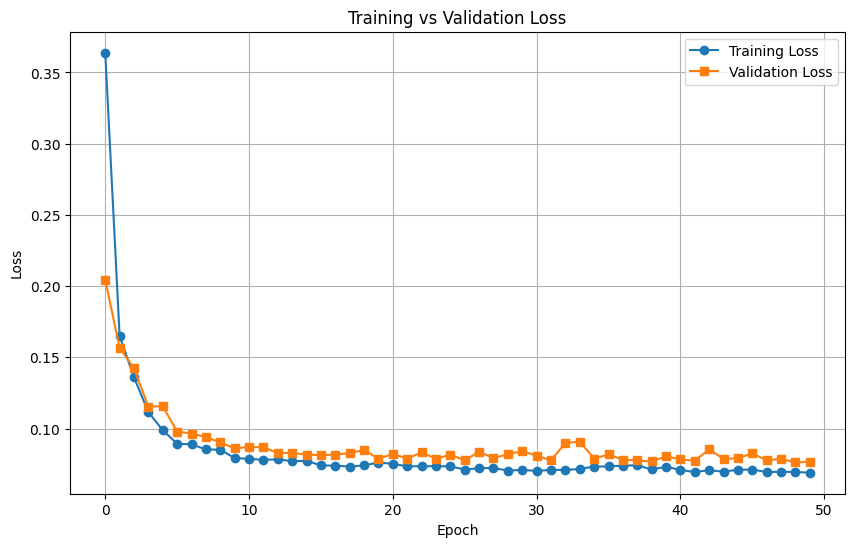

In [ ]:
from torch.utils.data import DataLoader
from tqdm import tqdm
from torchvision import transforms
import torch.nn as nn
import matplotlib.pyplot as plt
import torch

# ---------------------------------
# TRANSFORMS
# ---------------------------------
transform = transforms.Compose([
    transforms.ToTensor()
])

# ---------------------------------
# DATASETS & LOADERS
# ---------------------------------
train_img_dir = "/content/drive/MyDrive/CS230/Training/images"
train_svg_dir = "/content/drive/MyDrive/CS230/Training/labels_svg"

val_img_dir = "/content/drive/MyDrive/CS230/Validation/images"
val_svg_dir = "/content/drive/MyDrive/CS230/Validation/labels_svg"

train_dataset = SEMSegDataset(train_img_dir, train_svg_dir,
                              unique_colors_list,
                              resize_target=(1024, 1024),
                              transform=transform)

val_dataset = SEMSegDataset(val_img_dir, val_svg_dir,
                            unique_colors_list,
                            resize_target=(1024, 1024),
                            transform=transform)

train_loader = DataLoader(train_dataset, batch_size=1, shuffle=True)
val_loader   = DataLoader(val_dataset, batch_size=1, shuffle=False)

# ---------------------------------
# MODEL, OPTIMIZER, LOSS
# ---------------------------------
device = "cuda" if torch.cuda.is_available() else "cpu"
model = UNet(out_channels=num_classes_detected).to(device)

opt = torch.optim.Adam(model.parameters(), lr=1e-3)
loss_fn = nn.BCEWithLogitsLoss()

# ---------------------------------
# TRAINING LOOP
# ---------------------------------
num_epochs = 50
training_losses = []
validation_losses = []

for epoch in range(num_epochs):
    # ---------------------
    # TRAINING
    # ---------------------
    model.train()
    train_loss = 0.0

    for img, mask in tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs} - Training"):
        img, mask = img.to(device), mask.to(device)

        pred = model(img)
        loss = loss_fn(pred, mask)

        opt.zero_grad()
        loss.backward()
        opt.step()

        train_loss += loss.item()

    avg_train_loss = train_loss / len(train_loader)
    training_losses.append(avg_train_loss)

    # ---------------------
    # VALIDATION
    # ---------------------
    model.eval()
    val_loss = 0.0

    with torch.no_grad():
        for img, mask in tqdm(val_loader, desc=f"Epoch {epoch+1}/{num_epochs} - Validating"):
            img, mask = img.to(device), mask.to(device)
            pred = model(img)
            loss = loss_fn(pred, mask)
            val_loss += loss.item()

    avg_val_loss = val_loss / len(val_loader)
    validation_losses.append(avg_val_loss)

    # ---------------------
    # LOGGING
    # ---------------------
    print(f"\nEpoch {epoch+1}/{num_epochs}")
    print(f"  Training Loss:   {avg_train_loss:.4f}")
    print(f"  Validation Loss: {avg_val_loss:.4f}")

# ---------------------------------
# SAVE MODEL
# ---------------------------------
torch.save(model.state_dict(),
           "/content/drive/MyDrive/CS230/Training/unet_sem.pth")

# ---------------------------------
# PLOT LOSSES
# ---------------------------------
plt.figure(figsize=(10, 6))
plt.plot(training_losses, marker='o', label="Training Loss")
plt.plot(validation_losses, marker='s', label="Validation Loss")
plt.title("Training vs Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.grid(True)
plt.legend()
plt.show()


## Load Model and Define Prediction Function

In [ ]:
import torch
from torchvision import transforms
from PIL import Image
import numpy as np
import os

# Assuming UNet class is already defined and available from previous cells.
# Assuming num_classes_detected and unique_colors_list are available from previous cells.

# 1. Initialize the UNet model with out_channels set to num_classes_detected
#    and load the saved weights from unet_sem.pth.
#    Remember to move the model to the appropriate device (CPU or CUDA).
device = 'cuda' if torch.cuda.is_available() else 'cpu'
model = UNet(out_channels=num_classes_detected).to(device)
model.load_state_dict(torch.load('/content/drive/MyDrive/CS230/Training/unet_sem.pth', map_location=device))
model.eval() # Set model to evaluation mode

def predict_multi_mask(model, image_path, unique_colors_list, threshold):
    """
    Predicts multi-channel binary masks for a given image using the trained UNet model.

    Args:
        model (torch.nn.Module): The trained UNet model.
        image_path (str): Path to the input image.
        unique_colors_list (list): A sorted list of unique color strings representing classes.
        threshold (float): The threshold to binarize probability maps.

    Returns:
        tuple: A tuple containing:
            - dict: binary_masks_by_color (keys: color string, values: binary NumPy mask)
            - torch.Tensor: raw_pred_sigmoid (multi-channel probability maps before thresholding)
    """
    img = Image.open(image_path).convert('L')
    original_size = img.size # (width, height)
    original_size = original_size[::-1]

    # Resize the image to match the input size the model was trained on
    resize_transform = transforms.Resize((1024, 1024))
    img_resized = resize_transform(img)

    # Convert the resized image to a PyTorch tensor, add a batch dimension, and move to device
    img_tensor = transforms.ToTensor()(img_resized).unsqueeze(0).to(device)

    with torch.no_grad():
        raw_pred = model(img_tensor) # Output is logits
        raw_pred_sigmoid = torch.sigmoid(raw_pred).cpu().squeeze(0) # Apply sigmoid, move to CPU, remove batch dim

    binary_masks_by_color = {}
    # Iterate through unique_colors_list and extract corresponding channel
    for i, color in enumerate(unique_colors_list):
        # Extract the probability map for the current class
        class_prob_map = raw_pred_sigmoid[i].numpy()

        # Resize the class_prob_map back to original image size for accurate mask generation
        # Using PIL.Image.fromarray and then resizing, similar to how target masks were handled
        pil_prob_map = Image.fromarray((class_prob_map * 255).astype(np.uint8))
        resized_pil_prob_map = transforms.Resize(original_size)(pil_prob_map)
        resized_prob_map = np.array(resized_pil_prob_map) / 255.0

        # Apply threshold to binarize the map
        binary_mask = (resized_prob_map > threshold).astype(np.uint8) * 255
        binary_masks_by_color[color] = binary_mask

    # Optionally, resize the full raw_pred_sigmoid to original size for consistent output
    full_raw_pred_sigmoid_resized = torch.nn.functional.interpolate(
        raw_pred_sigmoid.unsqueeze(0), size=original_size, mode='bilinear', align_corners=False
    ).squeeze(0)

    return binary_masks_by_color, full_raw_pred_sigmoid_resized

print("Model loaded and predict_multi_mask function defined.")

Model loaded and predict_multi_mask function defined.


## Create Output Directories


In [ ]:
import os

# Create directory for probability maps
os.makedirs('/content/drive/MyDrive/CS230/Evaluation/prob_maps', exist_ok=True)
print("Directory 'prob_maps' created or already exists.")

# Create directory for binary segmentations
os.makedirs('/content/drive/MyDrive/CS230/Evaluation/binary_segmentations', exist_ok=True)
print("Directory 'binary_segmentations' created or already exists.")

Directory 'prob_maps' created or already exists.
Directory 'binary_segmentations' created or already exists.


In [ ]:
import os
import torch
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
import cv2

# Assuming image_drive_dir and unique_colors_list are already defined
# from previous cells: image_drive_dir, unique_colors_list, model, device

prediction_threshold = 0.95
image_drive_dir_test = '/content/drive/MyDrive/CS230/Evaluation/images'
image_files = [f for f in os.listdir(image_drive_dir_test) if f.endswith('.png')]

processed_image_count = 0
print(f"Processing {len(image_files)} images from {image_drive_dir_test}...")

for img_filename in tqdm(image_files, desc="Generating predictions and saving masks"):
    img_path = os.path.join(image_drive_dir_test, img_filename)

    # Ensure the image file actually exists
    if not os.path.exists(img_path):
        print(f"Warning: Image file not found at {img_path}. Skipping.")
        continue

    try:
        # Generate predictions
        binary_masks_by_color, raw_pred_sigmoid_resized = predict_multi_mask(
            model, img_path, unique_colors_list, prediction_threshold
        )
    except OSError as e:
        print(f"Warning: Could not process {img_filename} due to an error: {e}. Skipping.")
        continue # Skip to the next image if there's an OSError

    base_name = os.path.splitext(img_filename)[0]

    for i, color in enumerate(unique_colors_list):


        # Save raw probability map using Matplotlib to apply a colormap
        prob_map_np = raw_pred_sigmoid_resized[i].numpy() # This is already resized to original image size
        prob_map_save_path = os.path.join('/content/drive/MyDrive/CS230/Evaluation/prob_maps', f'{base_name}_{color}_prob.png')
        plt.imsave(prob_map_save_path, prob_map_np, cmap='viridis',metadata={'Orientation': None}) # Save with colormap

        # Save binarized mask
        binary_mask_np = binary_masks_by_color[color] # This is already resized to original image size
        binary_mask_pil = Image.fromarray(binary_mask_np)
        binary_mask_save_path = os.path.join('/content/drive/MyDrive/CS230/Evaluation/binary_segmentations', f'{base_name}_{color}_mask.png')
        binary_mask_pil.save(binary_mask_save_path)

        # --- PRINT SHAPES ---
        #print(f"Class {i} | Color: {color}")
        print("  Prob map shape:", prob_map_np.shape)
        #print("  Binary mask shape:", np.array(binary_mask_pil).shape)
    processed_image_count += 1

print(f"\nBatch processing complete. Processed {processed_image_count} images.")
print(f"Raw probability maps saved to: {os.path.abspath('/content/drive/MyDrive/CS230/Evaluation/prob_maps')}")
print(f"Binarized segmentations saved to: {os.path.abspath('/content/drive/MyDrive/CS230/Evaluation/binary_segmentations')}")

Processing 10 images from /content/drive/MyDrive/CS230/Evaluation/images...


Generating predictions and saving masks:   0%|          | 0/10 [00:00<?, ?it/s]

  Prob map shape: (3536, 4096)


Generating predictions and saving masks:  10%|█         | 1/10 [00:09<01:28,  9.84s/it]

  Prob map shape: (3536, 4096)
  Prob map shape: (3536, 4096)


Generating predictions and saving masks:  20%|██        | 2/10 [00:22<01:30, 11.29s/it]

  Prob map shape: (3536, 4096)
  Prob map shape: (3536, 4096)


Generating predictions and saving masks:  30%|███       | 3/10 [00:31<01:12, 10.33s/it]

  Prob map shape: (3536, 4096)
  Prob map shape: (3536, 4096)


Generating predictions and saving masks:  40%|████      | 4/10 [00:40<00:59,  9.90s/it]

  Prob map shape: (3536, 4096)
  Prob map shape: (3536, 4096)


Generating predictions and saving masks:  50%|█████     | 5/10 [00:49<00:47,  9.52s/it]

  Prob map shape: (3536, 4096)
  Prob map shape: (3536, 4096)


Generating predictions and saving masks:  60%|██████    | 6/10 [00:58<00:38,  9.50s/it]

  Prob map shape: (3536, 4096)
  Prob map shape: (3536, 4096)


Generating predictions and saving masks:  70%|███████   | 7/10 [01:08<00:28,  9.41s/it]

  Prob map shape: (3536, 4096)
  Prob map shape: (3536, 4096)


Generating predictions and saving masks:  80%|████████  | 8/10 [01:17<00:18,  9.33s/it]

  Prob map shape: (3536, 4096)
  Prob map shape: (3536, 4096)


Generating predictions and saving masks:  90%|█████████ | 9/10 [01:26<00:09,  9.24s/it]

  Prob map shape: (3536, 4096)
  Prob map shape: (3536, 4096)


Generating predictions and saving masks: 100%|██████████| 10/10 [01:35<00:00,  9.59s/it]

  Prob map shape: (3536, 4096)

Batch processing complete. Processed 10 images.
Raw probability maps saved to: /content/drive/MyDrive/CS230/Evaluation/prob_maps
Binarized segmentations saved to: /content/drive/MyDrive/CS230/Evaluation/binary_segmentations


# Convert to SVG files

# User Input: Specify Your File Paths and Configuration



In [ ]:
import sys
import subprocess

# Ensure necessary libraries are installed
for package in ['scikit-image', 'Pillow']:
    try:
        __import__(package)
    except ImportError:
        print(f"Installing {package}...")
        subprocess.check_call([sys.executable, '-m', 'pip', 'install', package])
        print(f"{package} installed successfully.")

Installing scikit-image...
scikit-image installed successfully.
Installing Pillow...
Pillow installed successfully.


In [ ]:
from PIL import Image
import numpy as np
from skimage.measure import find_contours
import os
from glob import glob

# --- Utility Functions ---

def load_mask_from_file(file_path):
    """
    Loads a binary mask from an image file and returns it as a boolean NumPy array.
    """
    try:
        image = Image.open(file_path)
        # Convert to '1' (binary) mode if not already, then to numpy array and boolean
        # Use Image.convert('L') and threshold to ensure binary conversion from various inputs
        mask_array = np.array(image.convert('L')) > 127 # Threshold at 127 for binary
        return mask_array
    except Exception as e:
        print(f"Error loading mask from {file_path}: {e}")
        return None

def mask_to_svg_path(mask):
    """
    Converts a binary mask into an SVG path string using skimage.measure.find_contours.
    """
    # find_contours returns a list of (row, column) coordinates for each contour.
    # Level 0.5 is chosen to find contours between 0s and 1s.
    contours = find_contours(mask, 0.5)
    svg_path_segments = []

    for contour in contours:
        if contour.shape[0] < 2:  # Ensure contour has at least two points
            continue

        # Convert (row, column) to (x, y) for SVG. SVG coordinates are (x, y).
        # The contour coordinates are typically (y, x), so we reverse them for SVG (col, row).
        path_points = []
        for i, (row, col) in enumerate(contour):
            # Round coordinates to avoid excessively long SVG strings and improve rendering consistency
            x, y = round(col, 2), round(row, 2)
            if i == 0:
                path_points.append(f"M{x} {y}")  # Moveto command for the first point
            else:
                path_points.append(f"L{x} {y}")  # Lineto command for subsequent points
        # Close the path (Z command)
        svg_path_segments.append(" ".join(path_points) + "Z")

    return " ".join(svg_path_segments)

print("Utility functions `load_mask_from_file` and `mask_to_svg_path` defined.")

Utility functions `load_mask_from_file` and `mask_to_svg_path` defined.


# User Configuration: Specify Your Folders and Mask Dimensions



In [ ]:
# --- USER CONFIGURATION START ---

# 1. Define the input folder path containing your binary mask images.
#    Mask files should be named consistently, e.g., 'image_name_red.png', 'image_name_green.png'.
input_masks_folder = '/content/drive/MyDrive/CS230/Evaluation/binary_segmentations/'

# 2. Define the output folder path where the generated SVG files will be saved.
output_svg_folder = '/content/drive/MyDrive/CS230/Evaluation/svg_output/'

# 3. Define the expected dimensions (width, height) of your binary masks.
#    This will be used for the SVG viewport dimensions.
mask_dimensions = (4096,3536) # (width, height)

# --- USER CONFIGURATION END ---


# --- Processing Logic ---

# Create the output_svg_folder if it does not already exist
os.makedirs(output_svg_folder, exist_ok=True)
print(f"Output folder ensured: {output_svg_folder}")

# Get a list of unique base filenames from the input_masks_folder.
# We assume for each 'image_name_red.png' there is a corresponding 'image_name_green.png'.
# Adjust the glob pattern if your file naming convention is different.
red_mask_files = glob(os.path.join(input_masks_folder, '*_blue_mask.png'))
base_filenames = sorted([os.path.basename(f).replace('_blue_mask.png', '') for f in red_mask_files])

print(f"Found {len(base_filenames)} mask sets to process.")

generated_svg_count = 0

for base_filename in base_filenames:
    print(f"\nProcessing mask set for: {base_filename}")

    # Construct the full file paths for the 'red' and 'green' mask images
    red_mask_path = os.path.join(input_masks_folder, f'{base_filename}_blue_mask.png')
    green_mask_path = os.path.join(input_masks_folder, f'{base_filename}_green_mask.png')

    # Check if both masks exist for the current base_filename
    if not os.path.exists(red_mask_path):
        print(f"  Skipping: Red mask not found at {red_mask_path}")
        continue
    if not os.path.exists(green_mask_path):
        print(f"  Skipping: Green mask not found at {green_mask_path}")
        continue

    # Load the 'red' mask
    red_mask = load_mask_from_file(red_mask_path)
    # Load the 'green' mask
    green_mask = load_mask_from_file(green_mask_path)

    if red_mask is None or green_mask is None:
        print(f"  Skipping {base_filename} due to loading error for one or both masks.")
        continue

    # Ensure masks have the correct dimensions (skimage.draw expects height, width which is rows, cols)
    expected_shape = (mask_dimensions[1], mask_dimensions[0]) # (height, width) for numpy array shape
    if red_mask.shape != expected_shape or green_mask.shape != expected_shape:
        print(f"  Warning: Mask dimensions for {base_filename} ({red_mask.shape}) do not match expected {expected_shape}. Proceeding but may lead to unexpected results.")
        # Optionally resize here if desired, but for now we'll just warn.

    # Convert the `green_mask` into an SVG path string
    green_svg_path_data = mask_to_svg_path(green_mask)
    # Convert the `red_mask` into an SVG path string
    red_svg_path_data = mask_to_svg_path(red_mask)


    # Construct the full SVG content
    # The width and height in the <svg> tag are the overall viewport dimensions.
    svg_content = f'''<svg width="{mask_dimensions[0]}" height="{mask_dimensions[1]}" viewBox="0 0 {mask_dimensions[0]} {mask_dimensions[1]}" xmlns="http://www.w3.org/2000/svg">
  <path fill="green" d="{green_svg_path_data}" />
  <path fill="red" d="{red_svg_path_data}" />
</svg>'''

    # Define the output SVG file path
    output_file_path = os.path.join(output_svg_folder, f'{base_filename}.svg')

    # Write the generated SVG content string to this output file
    with open(output_file_path, 'w', encoding='utf-8') as f:
        f.write(svg_content)

    print(f"  Generated SVG file: {output_file_path}")
    generated_svg_count += 1

print(f"\n--- Conversion Complete ---")
print(f"Successfully generated {generated_svg_count} SVG files in {output_svg_folder}")

Output folder ensured: /content/drive/MyDrive/CS230/Evaluation/svg_output/
Found 10 mask sets to process.

Processing mask set for: sem0000
  Generated SVG file: /content/drive/MyDrive/CS230/Evaluation/svg_output/sem0000.svg

Processing mask set for: sem0001
  Generated SVG file: /content/drive/MyDrive/CS230/Evaluation/svg_output/sem0001.svg

Processing mask set for: sem0002
  Generated SVG file: /content/drive/MyDrive/CS230/Evaluation/svg_output/sem0002.svg

Processing mask set for: sem0003
  Generated SVG file: /content/drive/MyDrive/CS230/Evaluation/svg_output/sem0003.svg

Processing mask set for: sem0004
  Generated SVG file: /content/drive/MyDrive/CS230/Evaluation/svg_output/sem0004.svg

Processing mask set for: sem0005
  Generated SVG file: /content/drive/MyDrive/CS230/Evaluation/svg_output/sem0005.svg

Processing mask set for: sem0006
  Generated SVG file: /content/drive/MyDrive/CS230/Evaluation/svg_output/sem0006.svg

Processing mask set for: sem0007
  Generated SVG file: /cont

# Verification (Optional)

You can optionally display a few of the generated SVG files to verify the output.

In [ ]:
from IPython.display import SVG, display

# Get a list of all generated .svg files in the output folder
svg_files_generated = [os.path.join(output_svg_folder, f) for f in os.listdir(output_svg_folder) if f.endswith('.svg')]

if not svg_files_generated:
    print("No SVG files found in the output folder to display.")
else:
    print(f"Displaying a sample of up to 3 generated SVG files from {output_svg_folder}:")
    for i, svg_file_path in enumerate(svg_files_generated[:3]): # Display up to the first 3 files
        print(f"\n--- Displaying: {os.path.basename(svg_file_path)} ---")
        with open(svg_file_path, 'r', encoding='utf-8') as f:
            svg_content = f.read()
        display(SVG(data=svg_content))

Displaying a sample of up to 3 generated SVG files from /content/drive/MyDrive/CS230/Evaluation/svg_output/:

--- Displaying: sem0000.svg ---



--- Displaying: sem0001.svg ---



--- Displaying: sem0002.svg ---
